# Implementing Fast R-CNN, Faster R-CNN, Mask R-CNN

## Imports 

In [2]:
import _init_paths
import sys
import os
import importlib
import shutil
import numpy as np
import threading
# import keras
import tqdm
from concurrent.futures import ThreadPoolExecutor, ProcessPoolExecutor
import pickle
import scipy
import scipy.io as scipyio

import selectivesearch
importlib.reload(selectivesearch)
from selectivesearch import get_selective_search_regions

import shutil
import copy
import PIL

import bbox_transform; importlib.reload(bbox_transform)
from bbox_transform import *

from IPython.core.debugger import Tracer
from IPython.display import clear_output

%matplotlib inline

from roi_pooling.modules.roi_pool import RoIPool as RoIPool_GPU

import rcnn_utils; importlib.reload(rcnn_utils); from rcnn_utils import *

import pascal_voc_reader; importlib.reload(pascal_voc_reader)

import data_utils; importlib.reload(data_utils); from data_utils import *

import utils.general; importlib.reload(utils.general); 
from utils.general import *

import datasets.ds_utils as ds_utils; importlib.reload(ds_utils);

import utils.cython_bbox as cython_bbox; importlib.reload(cython_bbox);
from utils.cython_bbox import bbox_overlaps

import roi_data_layer.roidb as roidb; importlib.reload(roidb);
from roi_data_layer.roidb import add_bbox_regression_targets

import roi_data_layer.minibatch as minibatch; importlib.reload(minibatch);
from roi_data_layer.minibatch import _sample_rois

import dataset; importlib.reload(dataset); from dataset import *;

##### Data prep class

## Pascal VOC

#### Load data

In [3]:
try:
    del dataset
except:
    pass
dataset = Pascal_VOC(data_path='../VOC/VOCdevkit/', 
                           year='2007', set_name='trainval')

In [71]:
# dataset.clear_cache()

In [75]:
dataset.sample_index = 0

In [ ]:
# TODO include gt with ss rois?

In [87]:
dataset.samples[0]


{'bbox_targets': array([[ 0.,  0.,  0.,  0.,  0.],
        [ 0.,  0.,  0.,  0.,  0.],
        [ 0.,  0.,  0.,  0.,  0.],
        ..., 
        [ 0.,  0.,  0.,  0.,  0.],
        [ 0.,  0.,  0.,  0.,  0.],
        [ 0.,  0.,  0.,  0.,  0.]], dtype=float32),
 'bboxes': [{'class': 'person', 'x1': 30, 'x2': 334, 'y1': 34, 'y2': 333},
  {'class': 'bottle', 'x1': 355, 'x2': 464, 'y1': 244, 'y2': 333},
  {'class': 'tvmonitor', 'x1': 119, 'x2': 169, 'y1': 87, 'y2': 148}],
 'filename': '004916.jpg',
 'filepath': '../VOC/VOCdevkit/VOC2007/JPEGImages/004916.jpg',
 'gt_boxes_xywh': array([[  52.2523,   59.4595,  548.7477,  539.7387,    1.    ],
        [ 637.8378,  437.8378,  197.3964,  161.3604,    2.    ],
        [ 212.6126,  154.955 ,   91.0901,  110.9099,    3.    ]]),
 'gt_boxes_xyxy': array([[  52.2523,   59.4595,  600.    ,  598.1982,    1.    ],
        [ 637.8378,  437.8378,  834.2342,  598.1982,    2.    ],
        [ 212.6126,  154.955 ,  302.7027,  264.8649,    3.    ]]),
 'gt_overlaps

#### Review

In [73]:
dataset_prep.num_classes

21

In [74]:
dataset_prep.class_name_to_id

{'aeroplane': 15,
 'bg': 0,
 'bicycle': 17,
 'bird': 16,
 'boat': 8,
 'bottle': 6,
 'bus': 20,
 'car': 5,
 'cat': 10,
 'chair': 3,
 'cow': 11,
 'diningtable': 2,
 'dog': 14,
 'horse': 18,
 'motorbike': 13,
 'person': 1,
 'pottedplant': 4,
 'sheep': 19,
 'sofa': 9,
 'train': 12,
 'tvmonitor': 7}

In [76]:
len(dataset_prep.samples)

9963

In [13]:
random_rois = np.random.permutation(range(1000))

[900 600]


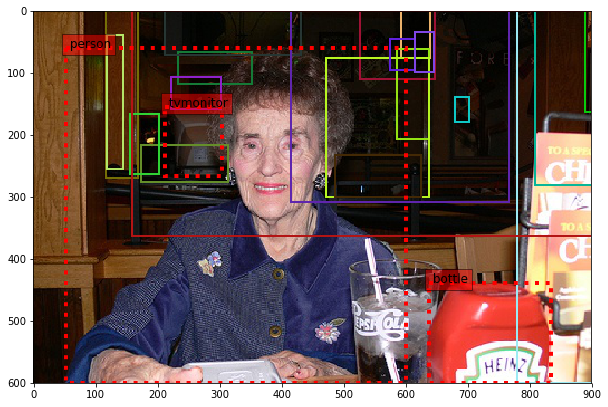

In [63]:
img_index = 0
image = PIL.Image.open(dataset.samples[img_index]['filepath'])
new_size = (np.array(image.size) * dataset.samples[img_index]['resize_ratio']).astype(int)
print(new_size)
image = image.resize(new_size)

regions = dataset.samples[img_index]['gt_boxes_xywh']
rois = dataset.samples[img_index]['roi_proposals_xywh']
display_image_regions(
    image,
    regions=rois[random_rois][:20],
    ground_truth_regions=regions,
    class_id_to_name=dataset.class_id_to_name)

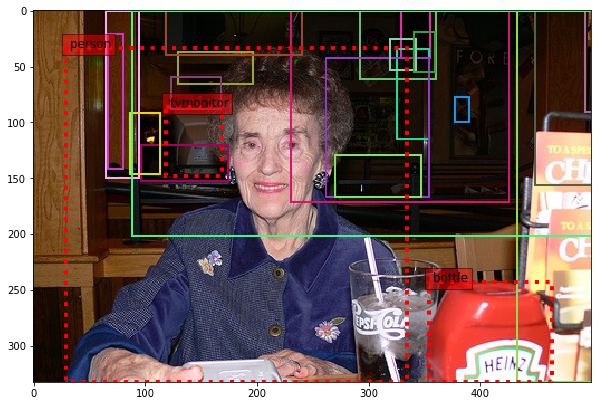

In [16]:
img_index = 0
image = np.asarray(PIL.Image.open(
    dataset.samples[img_index]['filepath']), dtype='uint8')
regions = dataset.samples[img_index]['gt_boxes_xywh']
rois = dataset.samples[img_index]['roi_proposals_xywh']
display_image_regions(
    image,
    regions=rois[random_rois][:20],
    ground_truth_regions=regions,
    class_id_to_name=dataset.class_id_to_name)

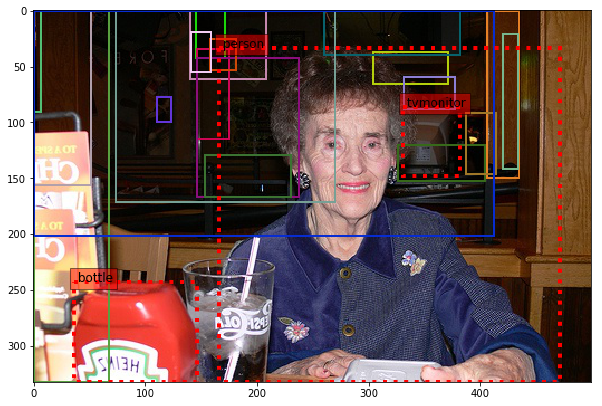

In [18]:
img_index = 5011
image = PIL.Image.open(dataset.samples[img_index]['filepath'])
image = np.asarray(PIL.ImageOps.mirror(image), dtype='uint8')
regions = dataset.samples[img_index]['gt_boxes_xywh']
rois = dataset.samples[img_index]['roi_proposals_xywh']
display_image_regions(
    image,
    regions=rois[random_rois][:20],
    ground_truth_regions=regions,
    class_id_to_name=dataset.class_id_to_name)

#### Augument ROIs and compute targets

Check if enough ROIs per image have intersections with ground truth boxes, if not create new ROIs based on the existing ones. Finally for each (new or exisiting) ROI compute the target vector.

In [19]:
def compute_roi_iou(roi, gt_boxes):
    '''
    Compute the IOU of the specified Region-of-Interest with all ground truth boxes,
    and return the max IOU found, and the ground truth box
    Args: 
        roi: The Region of interest
        gb_boxes: a list/array of all ground truth boxes to compute IOU with.
    '''
    ious = []
    for gt_box in gt_boxes:
        iou_computed = iou(gt_box, roi)
        ious.append(iou_computed)
    max_iou_index = np.asarray(ious).argmax()
    return ious[max_iou_index], gt_boxes[max_iou_index]


def get_augumented_regions_proposals(region):
    ''' Find a bunch of augumented ROI proposals by adjusting some of the region
    params. 
    Args:
        region: A tuple with (x, y, w, h) defining a region.
    '''
    x, y, w, h = region
    augumented_regions = []

    # Spatial scale is the min number of pixels to shift the region
    # to actually move to the next convolutional activation.
    # This should be mupltiples of 1 / spatial_scale from ROI Pooling
    # E.g. for VGG16 the spatial scale is 1/16, so here we use 16, 32.
    spatial_scales = (32, 16)
    for spatial_scale in spatial_scales:
        # Augumenting only a single parameter
        augumented_regions.extend([
            [x + spatial_scale, y, w, h],
            [x, y + spatial_scale, w, h],
            [x, y, w + spatial_scale, h],
            [x, y, w, h + spatial_scale],

            [x - spatial_scale, y, w, h],
            [x, y - spatial_scale, w, h],
            [x, y, w - spatial_scale, h],
            [x, y, w, h - spatial_scale]])

        # augument combinations of two params
        for spatial_scale2 in spatial_scales:
            augumented_regions.extend([
                [x + spatial_scale, y + spatial_scale2, w, h],
                [x + spatial_scale, y, w + spatial_scale2, h],
                [x + spatial_scale, y, w, h + spatial_scale2],
                [x + spatial_scale, y - spatial_scale2, w, h],
                [x + spatial_scale, y, w - spatial_scale2, h],
                [x + spatial_scale, y, w, h - spatial_scale2],

                [x - spatial_scale, y + spatial_scale2, w, h],
                [x - spatial_scale, y, w + spatial_scale2, h],
                [x - spatial_scale, y, w, h + spatial_scale2],
                [x - spatial_scale, y - spatial_scale2, w, h],
                [x - spatial_scale, y, w - spatial_scale2, h],
                [x - spatial_scale, y, w, h - spatial_scale2],

                [x, y + spatial_scale, w + spatial_scale2, h],
                [x, y + spatial_scale, w, h + spatial_scale2],
                [x, y + spatial_scale, w - spatial_scale2, h],
                [x, y + spatial_scale, w, h - spatial_scale2],

                [x, y - spatial_scale, w + spatial_scale2, h],
                [x, y - spatial_scale, w, h + spatial_scale2],
                [x, y - spatial_scale, w - spatial_scale2, h],
                [x, y - spatial_scale, w, h - spatial_scale2],

                [x, y, w + spatial_scale, h + spatial_scale2],
                [x, y, w + spatial_scale, h - spatial_scale2],

                [x, y, w - spatial_scale, h + spatial_scale2],
                [x, y, w - spatial_scale, h - spatial_scale2],
            ])
    # remove aug region if we have coordinates lower than zero
    augumented_regions_clean = []
    for region in augumented_regions:
        x1, y1, w, h = region
        x2 = x1 + w
        y2 = y1 + h
        region_inside_image = (x1 >= 0 and y1 >= 0
                               and x2 < image_size[0]
                               and y2 < image_size[1])
        positive_weight_and_height = (w > 0 and h > 0)
        if region_inside_image and positive_weight_and_height:
            augumented_regions_clean.append(region)

    augumented_regions_clean = [region for region in augumented_regions
                                if region[0] >= 0 and region[1] >= 0
                                and region[2] > 0 and region[3] > 0
                                and (region[0] + region[2])]

    return augumented_regions_clean


def augument_regions(regions, min_number, gt_boxes, min_iou, max_iou=None):
    ''' Try random petrubations to augument ROIs. As we need a minimum number of
    positive and negative rois. 
    Args:
        regions: The regions to augument.
        min_number: How many regions should we have. So we don't waste time 
            looking for more than needed.
        gt_boxes: the ground truth boxes.
        min_iou: The minumum Intersection over Union a good augumented region 
            should have with at least 1 ground truth box.
        max_iou: The max IOU an augumented region should have.
    '''
    good_regions = []
    regions_targets = []
    # Augument each good region found so far (proposed by Selective search,
    # or other algo)
    augumented_regions = []
    for region in regions:
        augumented_regions.extend(get_augumented_regions_proposals(region))

    # Shuffle the augumented regions so that each region has a chance to be
    # augumented.
    shuffle_mask = np.random.permutation(len(augumented_regions))
    augumented_regions = np.asarray(augumented_regions)[shuffle_mask]

    # We have a bunch of possible augumented regions,
    # let's test to see if they have proper IoU.
    for aug_region in augumented_regions:
        iou_computed, gt_box = compute_roi_iou(aug_region, gt_boxes)
        if iou_computed >= min_iou and iou_computed < max_iou:
            # which class is this region a sample for.
            good_regions.append(aug_region)
            target = regression_target(aug_region, gt_box)
            regions_targets.append(target)
        # If we got enough regions, exit to save time
        if len(good_regions) >= min_number:
            return good_regions, regions_targets

    return good_regions, regions_targets


def regression_target(roi, truth):
    ''' Create the regression target for this roi'''
    def center_box(box):
        x, y, w, h = box[:4]
        center_x = x + 0.5 * w
        center_y = y + 0.5 * h
        return (center_x, center_y, w, h, )

    class_id = truth[4]
    ex_ctr_x, ex_ctr_y, ex_widths, ex_heights = center_box(roi)
    gt_ctr_x, gt_ctr_y, gt_widths, gt_heights = center_box(truth)

    eps = 1e-7
    targets_dx = (gt_ctr_x - ex_ctr_x) / (ex_widths + eps)
    targets_dy = (gt_ctr_y - ex_ctr_y) / (ex_heights + eps)
    targets_dw = np.log(gt_widths / (ex_widths + eps))
    targets_dh = np.log(gt_heights / (ex_heights + eps))

    return np.asarray([targets_dx, targets_dy, targets_dw, targets_dh, class_id])

In [20]:
# Intersection over Union metric
def iou(box1, box2):
    ''' Computes the intersection over union for two boxes.
    '''
    epsilon = 1e-7
    x1, y1, w1, h1 = box1[:4]
    x2, y2, w2, h2 = box2[:4]

    intersection_x1 = max(x1, x2)
    intersection_y1 = max(y1, y2)
    intersection_x2 = min(x1 + w1, x2 + w2)
    intersection_y2 = min(y1 + h1, y2 + h2)

    # The area can't be less than 0
    intersection_area = (max(0, intersection_x2 - intersection_x1)
                         * max(0, intersection_y2 - intersection_y1))

    true_area = abs(h1 * w1)
    pred_area = abs(h2 * w2)
    iou = intersection_area / (true_area + pred_area
                               - intersection_area + epsilon)

    return iou


# Some tests
iou_computed = iou(
    [0, 1, 12, 10],
    [12, 11, 6, 6])
np.testing.assert_array_almost_equal(iou_computed, 0)

iou_computed = iou(
    [0, 1, 10, 9],
    [9, 9, 5, 5])
np.testing.assert_array_almost_equal(iou_computed, 1 / 114)

iou_computed = iou(
    [10, 11, 6, 5],
    [12, 13, 1, 2])
np.testing.assert_array_almost_equal(iou_computed, 2 / 30)

iou_computed = iou(
    [283.5, 190.5, 26., 65.5],
    [479, 244, 22, 35])
np.testing.assert_array_almost_equal(iou_computed, 0)

iou_computed = iou(
    [283.5, 190.5, 26., 65.5],
    [437, 133, 29, 33])
np.testing.assert_array_almost_equal(iou_computed, 0)

#### Prepare RoIs

In [3]:
# filename = 'intermediate/voc/voc_rois_{}x{}_scale_750.bcolz'.format(
#     image_size[0], image_size[1])
# all_regions = load_array(filename)

filename = 'intermediate/voc/ss_matlab_computed_regions_{}x{}.bcolz'.format(
    image_size[0], image_size[1])
all_regions = load_array(filename)

all_regions = np.array(all_regions)

In [ ]:
all_regions.shape, truth_boxes.shape

In [21]:
# %%time
samples_count = []
# Min and max ious for a box to be considered positive/negative
min_positive_iou = 0.5
max_positive_iou = 1.1  # it shouldn't really go above 1 anyways

min_negative_iou = 0.1
max_negative_iou = 0.5

# We will store the positive and negative regions for each image in these
all_positive_regions = []
all_positive_targets = []
all_negative_regions = []
all_negative_targets = []

for image_boxes, regions in zip(truth_boxes, all_regions):
    positive_samples = []
    positive_targets = []
    negative_samples = []
    negative_targets = []
    if regions is not None:
        for region in regions:
            iou_computed, truth_box = compute_roi_iou(region, image_boxes)
            if iou_computed >= min_positive_iou:
                # without the class_id
                positive_samples.append(region[:4])
                target = regression_target(region, truth_box)
                positive_targets.append(target)

            elif (iou_computed >= min_negative_iou
                  and iou_computed < max_negative_iou):
                # without the class_id
                negative_samples.append(region[:4])
                target = np.asarray([0, 0, 0, 0, 0])
                negative_targets.append(target)

#     # augument positive samples if not enough
#     min_positive_samples = 16 * 2
#     if (len(positive_samples) > 0
#             and len(positive_samples) < min_positive_samples):
#         addition_samples_needed = min_positive_samples - len(positive_samples)
#         augumented_regions, regions_targets = augument_regions(
#             positive_samples, addition_samples_needed,
#             image_boxes,
#             min_iou=min_positive_iou, max_iou=max_positive_iou)
#         positive_samples.extend(augumented_regions)
#         positive_targets.extend(regions_targets)

#     min_negative_samples = 48 * 2
#     if (len(negative_samples) > 0
#             and len(negative_samples) < min_negative_samples):
#         addition_samples_needed = min_negative_samples - len(negative_samples)
#         augumented_regions, regions_targets = augument_regions(
#             negative_samples, addition_samples_needed,
#             image_boxes,
#             min_iou=min_negative_iou, max_iou=max_negative_iou)
#         negative_samples.extend(augumented_regions)
#         # The target for negative classes is 0
#         background_class_targets = np.zeros_like(regions_targets)
#         negative_targets.extend(background_class_targets)

    all_positive_regions.append(positive_samples)
    all_positive_targets.append(positive_targets)

    all_negative_regions.append(negative_samples)
    all_negative_targets.append(negative_targets)

    samples_count.append((len(positive_samples), len(negative_samples)))

In [22]:
samples_count = np.array(samples_count)

In [23]:
len(samples_count)

17125

In [24]:
# do we have enough positive and negative samples for each image
enough_samples_mask = (samples_count[:, 0] >= 16) & (samples_count[:, 1] >= 48)
print('Images with enough positive and negative rois:',
      np.sum(enough_samples_mask))

Images with enough positive and negative rois: 14301


Extract the positive and negative regions that are enough.

In [31]:
all_positive_regions = np.asarray(all_positive_regions)
all_positive_targets = np.asarray(all_positive_targets)
all_negative_regions = np.asarray(all_negative_regions)
all_negative_targets = np.asarray(all_negative_targets)

In [32]:
# save the mask
filename = 'intermediate/voc/voc_enough_samples_mask_{}x{}.bcolz'.format(
    image_size[0], image_size[1])
save_array(filename, enough_samples_mask)

# save positive and negative rois
filename = 'intermediate/voc/voc_positive_rois_{}x{}.bcolz'.format(
    image_size[0], image_size[1])
save_array(filename, all_positive_regions)

filename = 'intermediate/voc/voc_positive_rois_targets_{}x{}.bcolz'.format(
    image_size[0], image_size[1])
save_array(filename, all_positive_targets)


filename = 'intermediate/voc/voc_negative_rois_{}x{}.bcolz'.format(
    image_size[0], image_size[1])
save_array(filename, all_negative_regions)

filename = 'intermediate/voc/voc_negative_rois_targets_{}x{}.bcolz'.format(
    image_size[0], image_size[1])
save_array(filename, all_negative_targets)

#### Split into train-valid set

In [33]:
num_samples = np.sum(enough_samples_mask)
# 10% validation set
num_valid_samples = int(num_samples / 10)
num_train_samples = num_samples - num_valid_samples

random_indexes = np.random.permutation(num_samples)
valid_indexes = random_indexes[:num_valid_samples]
train_indexes = random_indexes[num_valid_samples:]
save_array('intermediate/voc/voc_valid_indexes.bcolz', valid_indexes)
save_array('intermediate/voc/voc_train_indexes.bcolz', train_indexes)

#### Prepare regression targets

##### NORMALIZE TARGETS

Compute the mean and standard deviation of the targets for each class.

In [34]:
all_positive_regions_targets = all_positive_targets[enough_samples_mask]
all_positive_regions_targets.shape

(14301,)

In [41]:
filename = 'intermediate/voc/voc_positive_rois_targets_{}x{}.bcolz'.format(
    image_size[0], image_size[1])
all_positive_regions_targets = load_array(filename)

In [44]:
filename = 'intermediate/voc/voc_enough_samples_mask_{}x{}.bcolz'.format(
    image_size[0], image_size[1])
enough_samples_mask = load_array(filename)

In [45]:
all_positive_regions_targets = all_positive_regions_targets[enough_samples_mask]
all_positive_regions_targets.shape

(14301,)

In [47]:
num_classes = 21

In [48]:
EPS = 1e-8
class_counts = np.zeros((num_classes, 1)) + EPS
sums = np.zeros((num_classes, 4))
squared_sums = np.zeros((num_classes, 4))

for image_index in range(len(all_positive_regions_targets)):
    targets = np.array(all_positive_regions_targets[image_index])
    for class_id in range(1, num_classes):
        class_targets_indices = np.where(targets[:, 4] == class_id)[0]
        if class_targets_indices.size > 0:
            class_counts[class_id] += class_targets_indices.size
            sums[class_id, :] += targets[class_targets_indices, :4].sum(axis=0)
            squared_sums[class_id, :] += (
                (targets[class_targets_indices, :4] ** 2).sum(axis=0))

means = sums / class_counts
stds = np.sqrt(squared_sums / class_counts - means ** 2)

In [49]:
means, std

(array([[ 0.    ,  0.    ,  0.    ,  0.    ],
        [-0.0007, -0.0151, -0.0355,  0.1375],
        [-0.0018, -0.0232, -0.0575,  0.1463],
        [-0.0024, -0.0107,  0.0234,  0.072 ],
        [-0.0013,  0.0025,  0.0254,  0.0847],
        [-0.002 , -0.004 , -0.003 ,  0.1003],
        [ 0.0005,  0.009 , -0.0236,  0.0921],
        [-0.0008, -0.0003,  0.0527,  0.0734],
        [-0.0035,  0.0139,  0.0033,  0.0801],
        [ 0.0005,  0.0009,  0.0337,  0.054 ],
        [-0.0022,  0.0074,  0.0362,  0.0738],
        [-0.0009, -0.0094,  0.0436,  0.0845],
        [-0.0007,  0.0066,  0.0314,  0.0797],
        [-0.002 ,  0.0245, -0.0088,  0.1132],
        [-0.0005, -0.0131,  0.0494,  0.0539],
        [-0.0014, -0.0002,  0.0608,  0.0691],
        [-0.0012,  0.0026, -0.0016,  0.0767],
        [-0.003 , -0.007 ,  0.0059,  0.0893],
        [-0.0018,  0.0054,  0.0692,  0.0547],
        [-0.0019,  0.0105,  0.0759,  0.0081],
        [-0.0021,  0.0227,  0.037 ,  0.0913]]),
 array([[ 0.    ,  0.    ,  0.  

In [50]:
filename = 'intermediate/voc/roi_targets_mean_{}x{}.bcolz'.format(
    image_size[0], image_size[1])
save_array(filename, means)

filename = 'intermediate/voc/roi_targets_std_{}x{}.bcolz'.format(
    image_size[0], image_size[1])
save_array(filename, stds)


Apply the mean and std to normalize the targets.

In [40]:
filename = 'intermediate/voc/voc_positive_rois_targets_{}x{}.bcolz'.format(
    image_size[0], image_size[1])
all_positive_regions_targets = load_array(filename)
all_positive_regions_targets.shape

(17125,)

In [37]:
for image_index in range(len(all_positive_regions_targets)):
    targets = np.array(all_positive_regions_targets[image_index])
    if targets.size == 0:
        continue
    for class_id in range(1, num_classes):
        class_targets_indices = np.where(targets[:, 4] == class_id)[0]
        targets[class_targets_indices, :4] -= means[class_id, :]
        targets[class_targets_indices, :4] /= stds[class_id, :]
        all_positive_regions_targets[image_index] = targets

Save the normalized targets.

In [38]:
filename = ('intermediate/voc/'
            + 'voc_positive_rois_targets_normalized_{}x{}.bcolz').format(
    image_size[0], image_size[1])
save_array(filename, all_positive_regions_targets)

#### Precompute train features

In [14]:
features_model = get_vgg_conv(skip_last_layers=1).cuda()

In [52]:
reset_index('train')
for batch_index in range(10):
    max_index = (len(train_samples) * (batch_index + 1)) // 10
    print(max_index, end=' ')
    train_features = np.empty((0, 512, 31, 31))
    while True:
        # While not the cleanest way, get_batch will throw an error when the dataset
        # is exausted, and then the loop will exit.
        if train_index[0] >= max_index:
            break
        try:
            batch = get_batch(images_per_batch=32,
                              images_only=True, loop_over=False)
        except TypeError as error:
            # While not the cleanest way, get_batch will throw an error when the dataset
            # is exausted, and then the loop will exit.
            break

        # Get and save the features
        features = features_model(Variable(batch.cuda(), volatile=True))
        features_arr = features.cpu().data.numpy().astype('float32', copy=False)
        train_features = np.vstack([train_features, features_arr])
        del features
        del features_arr

    filename = 'intermediate/voc/voc_precomputed_features_{}x{}_batch_{}.bcolz'.format(
        image_size[0], image_size[1], batch_index)
    save_array(filename, train_features)
    print(len(train_features), train_index[0])
    del train_features

1287 1312 1312 2574 1280 2592 3861 1280 3872 5148 1280 5152 6435 1312 6464 7722 1280 7744 9009 1280 9024 10296 1280 10304 11583 1280 11584 12871 1287 12896 

In [15]:
# Validation features
reset_index('valid')
valid_features = np.empty((0, 512, 31, 31))
while True:
    try:
        batch = get_batch(source='valid', images_per_batch=32,
                          images_only=True, loop_over=False)
    except TypeError as error:
        # While not the cleanest way, get_batch will throw an error when the dataset
        # is exausted, and then the loop will exit.
        break
    if len(batch) == 0: 
        break

    # Get and save the features
    features = features_model(Variable(batch.cuda(), volatile=True))
    features_arr = features.cpu().data.numpy().astype('float32', copy=False)
    valid_features = np.vstack([valid_features, features_arr])
    del features
    del features_arr

filename = 'intermediate/voc/voc_precomputed_features_valid_{}x{}.bcolz'.format(
    image_size[0], image_size[1])
save_array(filename, valid_features)
del valid_features

print(valid_index[0])

1472


#### Combine into a single array

In [13]:
train_features = np.zeros((len(train_samples), 512, 31, 31), dtype=np.float16)

In [14]:
start = 0
for batch_index in range(10):
    filename = 'intermediate/voc/voc_precomputed_features_{}x{}_batch_{}.bcolz'.format(
        image_size[0], image_size[1], batch_index)
    features_batch = load_array(filename)

    end = start + len(features_batch)
    print(start, end, features_batch.shape)
    train_features[start:end] = features_batch
    del features_batch
    start = end

0 1312 (1312, 512, 31, 31)
1312 2592 (1280, 512, 31, 31)
2592 3872 (1280, 512, 31, 31)
3872 5152 (1280, 512, 31, 31)
5152 6464 (1312, 512, 31, 31)
6464 7744 (1280, 512, 31, 31)
7744 9024 (1280, 512, 31, 31)
9024 10304 (1280, 512, 31, 31)
10304 11584 (1280, 512, 31, 31)
11584 12871 (1287, 512, 31, 31)


In [18]:
filename = 'intermediate/voc/voc_precomputed_features_{}x{}_all.bcolz'.format(
    image_size[0], image_size[1])

save_array(filename, train_features)

#### Load precomputed data

In [3]:
dataset = RCNN_All_Data(image_size=(500, 500))

Parsing annotation files
[Errno 2] No such file or directory: './data/VOC2012/ImageSets/Main/test.txt'


In [17]:
trn_dataset = RCNN_Set(dataset, 'train')
val_dataset = RCNN_Set(dataset, 'valid')

In [18]:
batch = trn_dataset.next_batch()

##### Review

In [43]:
img_index = 100
len(train_rois[img_index]), len(train_positive_rois[img_index]), len(
    train_negative_rois[img_index])

(246, 108, 275)

In [44]:
enough_samples_mask

array([ True,  True,  True, ...,  True,  True,  True], dtype=bool)

In [45]:
train_filenames = np.array(filenames)[enough_samples_mask][train_indexes]

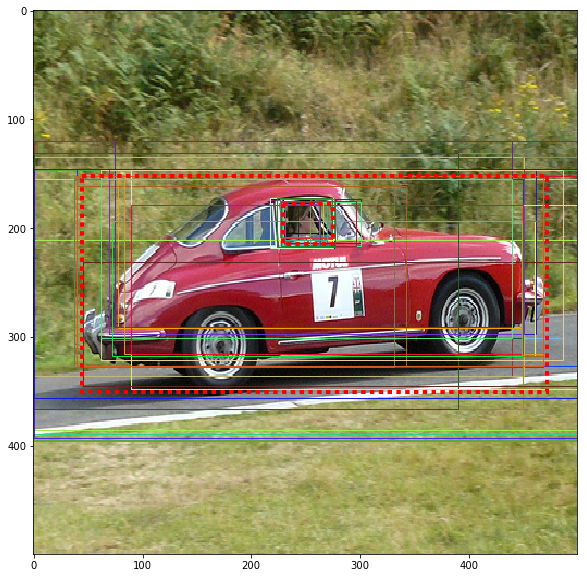

In [30]:
img_index = 1
display_image_regions(trn_dataset.images[img_index], 
                      trn_dataset.positive_rois[img_index],
                      trn_dataset.gt_boxes[img_index])

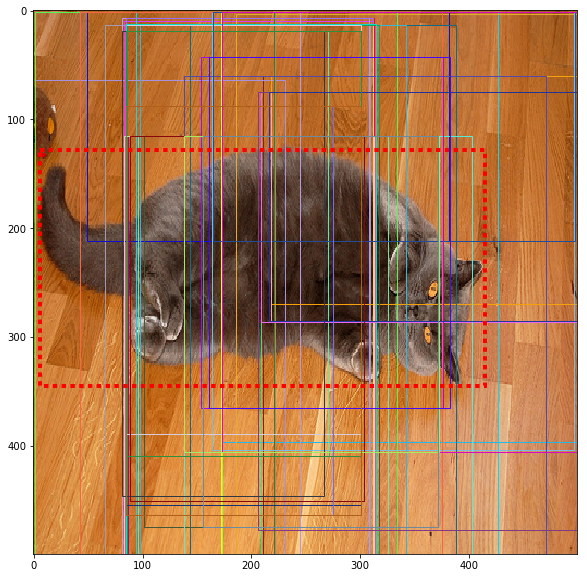

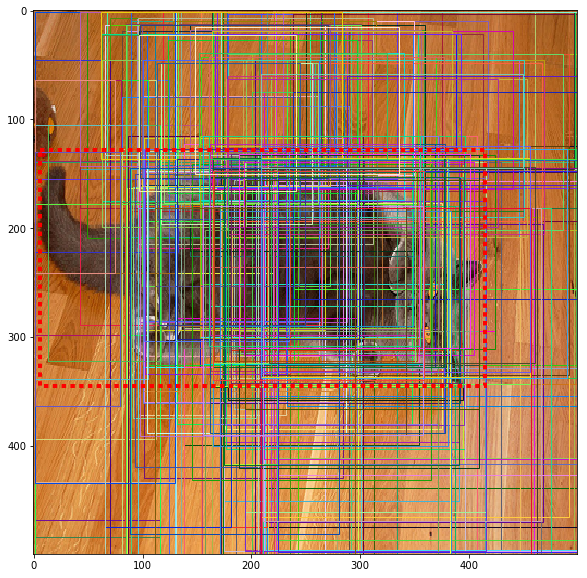

In [47]:
img_index = 2
display_image_regions(train_samples[img_index], train_positive_rois[img_index],
                      train_gt_boxes[img_index])

display_image_regions(train_samples[img_index], train_negative_rois[img_index],
                      train_gt_boxes[img_index])

## Fishing

### Load Data

In [2]:
image_size = (360, 640)

In [3]:
# Load data
data_gen = get_batch('../fishing/data/train', image_size)
filenames = data_gen.filenames

Found 3212 images belonging to 8 classes.


In [32]:
all_samples = get_all_generator_samples(data_gen)
samples_filename = 'test_samples_{}x{}.bcolz'.format(
    image_size[0], image_size[1])
save_array(samples_filename, all_samples)

In [4]:
samples_filename = 'train_samples_{}x{}.bcolz'.format(
    image_size[0], image_size[1])
all_samples = load_array(samples_filename)
all_samples.shape

(3212, 360, 640, 3)

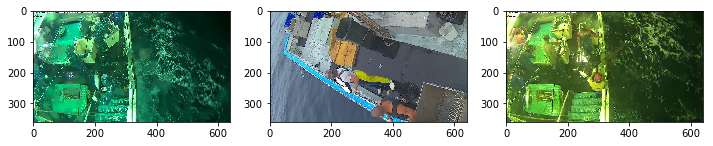

In [5]:
plot_images(all_samples[:3])

### Selective Search

In [29]:
def get_ss_regions(i):
    return get_selective_search_regions(all_samples[i].astype('uint8'),
                                        scale=750)

In [57]:
% % time
img = train_samples[1]  # all_samples[6].astype('uint8')
regions = get_selective_search_regions(img, scale=750)
print(len(regions))
# display_image_regions(img, regions, figsize=(12, 12))

223
CPU times: user 1.94 s, sys: 12 ms, total: 1.96 s
Wall time: 1.95 s


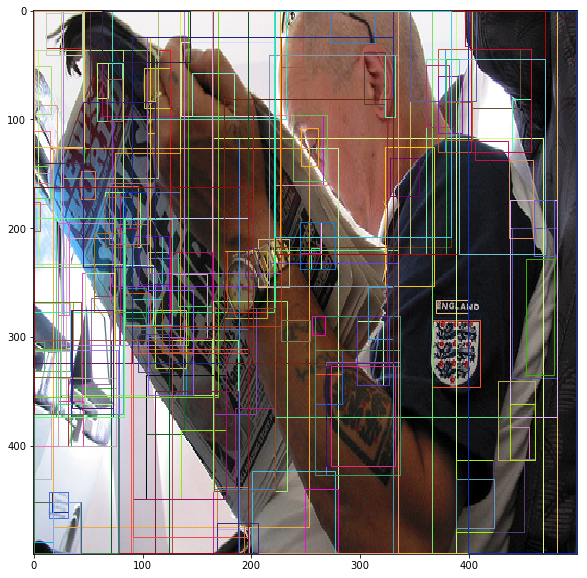

In [58]:
display_image_regions(img, regions)

In [ ]:
% % time
regions = []
for i in range(10):
    regions.append(get_selective_search_regions(all_samples[i].astype('uint8'),
                                                scale=50))

It is quite slow so let's see if we can speed it up with multithreading.

#### SS with multithreading


Test a few different number of workers to figure out what works best.

In [ ]:
% % time
num_samples = 50  # len(all_samples)
regions = []
with ThreadPoolExecutor(max_workers=4) as executor:
    regions = executor.map(get_ss_regions, range(num_samples))

2m 1s

In [120]:
% % time
num_samples = 50  # len(all_samples)
regions = []
with ThreadPoolExecutor(max_workers=8) as executor:
    regions = executor.map(get_ss_regions, range(num_samples))

CPU times: user 3min 53s, sys: 7.54 s, total: 4min 1s
Wall time: 2min 7s


In [121]:
% % time
num_samples = 50  # len(all_samples)
regions = []
with ThreadPoolExecutor(max_workers=16) as executor:
    regions = executor.map(get_ss_regions, range(num_samples))

CPU times: user 4min 1s, sys: 9.51 s, total: 4min 11s
Wall time: 2min 11s


In [122]:
% % time
num_samples = 50  # len(all_samples)
regions = []
with ThreadPoolExecutor(max_workers=32) as executor:
    regions = executor.map(get_ss_regions, range(num_samples))

CPU times: user 4min 10s, sys: 10.4 s, total: 4min 21s
Wall time: 2min 15s


#### SS with multiprocessing

In [128]:
num_samples = 50  # len(all_samples)
regions = []
with ProcessPoolExecutor(max_workers=2) as executor:
    regions = executor.map(get_ss_regions, range(num_samples))

1m 23.8s

In [123]:
num_samples = 50  # len(all_samples)
regions = []
with ProcessPoolExecutor(max_workers=4) as executor:
    regions = executor.map(get_ss_regions, range(num_samples))

1m 10.7s

In [124]:
num_samples = 50  # len(all_samples)
regions = []
with ProcessPoolExecutor(max_workers=8) as executor:
    regions = executor.map(get_ss_regions, range(num_samples))

 1m 11.8s

In [125]:
num_samples = 50  # len(all_samples)
regions = []
with ProcessPoolExecutor(max_workers=16) as executor:
    regions = executor.map(get_ss_regions, range(num_samples))

1m 14.9s

In [126]:
num_samples = 50  # len(all_samples)
regions = []
with ProcessPoolExecutor(max_workers=32) as executor:
    regions = executor.map(get_ss_regions, range(num_samples))

1m 18.2s

So it seems miltiprocessing with 4 processes works best: the P2 istance this is running on has 4 virtual CPUs, apparently with a single thread on each.

#### Compute regions for all images

##### Validation set regions

In [10]:
# Load data
data_gen = get_batch('../fishing/data/valid', image_size)
filenames = data_gen.filenames

samples_filename = 'valid_samples_{}x{}.bcolz'.format(
    image_size[0], image_size[1])
all_samples = load_array(samples_filename)
all_samples.shape

Found 547 images belonging to 8 classes.


(547, 360, 640, 3)

In [25]:
num_samples = len(all_samples)
regions = []
with ProcessPoolExecutor(max_workers=4) as executor:
    regions = executor.map(get_ss_regions, range(num_samples))

save_array('valid_regions.bcolz', list(regions))

##### Train set regions

In [197]:
# Load data
data_gen = get_batch('../fishing/data/train', image_size)
filenames = data_gen.filenames

samples_filename = 'train_samples_{}x{}.bcolz'.format(
    image_size[0], image_size[1])
all_samples = load_array(samples_filename)
all_samples.shape

Found 3212 images belonging to 8 classes.


(3212, 360, 640, 3)

In [ ]:
num_samples = len(all_samples)
regions = []
with ProcessPoolExecutor(max_workers=4) as executor:
    regions = executor.map(get_ss_regions, range(num_samples))

save_array('valid_regions.bcolz', list(regions))

##### Test set regions

In [35]:
# Load data
data_gen = get_batch('../fishing/data/test', image_size)
filenames = data_gen.filenames

samples_filename = 'test_samples_{}x{}.bcolz'.format(
    image_size[0], image_size[1])
all_samples = load_array(samples_filename)
all_samples.shape

Found 1000 images belonging to 1 classes.


(1000, 360, 640, 3)

In [36]:
num_samples = len(all_samples)
regions = []
with ProcessPoolExecutor(max_workers=4) as executor:
    regions = executor.map(get_ss_regions, range(num_samples))

save_array('test_regions.bcolz', list(regions))

##### Load regions

In [26]:
def load_regions(filename):
    regions = load_array(filename)
    # remove the filename from the array
    return [list(region[1]) for region in regions]


train_regions = load_regions('train_regions.bcolz')
len(train_regions)

17125

#### Load groundtruth boxes

In [93]:
save_dir = '../fishing/intermediate/bboxes/'
train_truth = load_array(os.path.join(
    save_dir, 'train_bbox_prepared_{}x{}'.format(image_size[0], image_size[1])))
valid_truth = load_array(os.path.join(
    save_dir, 'valid_bbox_prepared_{}x{}'.format(image_size[0], image_size[1])))
train_truth.shape, valid_truth.shape

((3212, 4), (547, 4))

In [94]:
# the truth bboxes are in format (x,y,h,w) and we want them in (x,y,w,h)
train_truth[:, [2, 3]] = train_truth[:, [3, 2]]
valid_truth[:, [2, 3]] = valid_truth[:, [3, 2]]

In [ ]:
img_index = 100
img = all_samples[img_index].astype('uint8')
regions = train_regions[img_index]
truth_box = train_truth[img_index]

display_image_regions(
    img, regions, ground_truth_box=truth_box, figsize=(12, 12))
train_bboxes[100]

#### Do proposed regions have intersections with the groundtruths

Let's calculate how many of our ROIs have IOUs >= 0.5 and in [0.1, 0.5)


In [210]:
max_ious = []
for truth, regions in zip(train_truth, train_regions):
    positive_samples = []
    negative_samples = []
    max_iou = 0
    min_iou = 0
    for region in regions:
        iou_computed = iou(truth_box, region)
        if iou_computed >= 0.3:
            positive_samples.append(region)
        elif iou_computed >= 0.05 and iou_computed < 0.3:
            negative_samples.append(region)
        max_iou = max(iou_computed, max_iou)
    max_ious.append(max_iou)
#     print(len(positive_samples), len(negative_samples))

In [215]:
np.sum(np.array(max_ious) >= 0.5)

384

In [ ]:
display_image_regions(img, positive_samples,
                      ground_truth_box=truth_box, figsize=(12, 12))

# Fast RCNN

## Test get batch

In [132]:
reset_index('train')

In [133]:
images, rois, targets = get_batch('train')

In [161]:
positive_regions_indices = targets[:64, 4] > 0
targets[:64, 4], positive_regions_indices

(array([ 0.,  7.,  0.,  7.,  0.,  7.,  7.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  7.,  0.,  0.,  0.,  0.,  7.,  7.,  0.,  0.,  0.,  7.,  7.,  0.,  0.,  0.,  7.,
         0.,  0.,  0.,  7.,  0.,  7.,  0.,  7.,  7.,  7.,  0.,  0.,  0.,  0.,  7.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.]),
 array([False,  True, False,  True, False,  True,  True, False, False, False, False, False, False,
        False, False, False, False, False, False, False,  True, False, False, False, False,  True,
         True, False, False, False,  True,  True, False, False, False,  True, False, False, False,
         True, False,  True, False,  True,  True,  True, False, False, False, False,  True, False,
        False, False, False, False, False, False, False, False, False, False, False, False], dtype=bool))

In [162]:
regions = rois[:64]
pos_regions = regions[positive_regions_indices]
regions.shape, pos_regions.shape

((64, 4), (16, 4))

In [49]:
image_index = 0
image_denormalized = denormalize(images[image_index])
to_image = torchvision.transforms.ToPILImage()
image = to_image(image_denormalized)
image_arr = np.array(image)
image

In [176]:
image_arr.shape

(3, 500, 500)

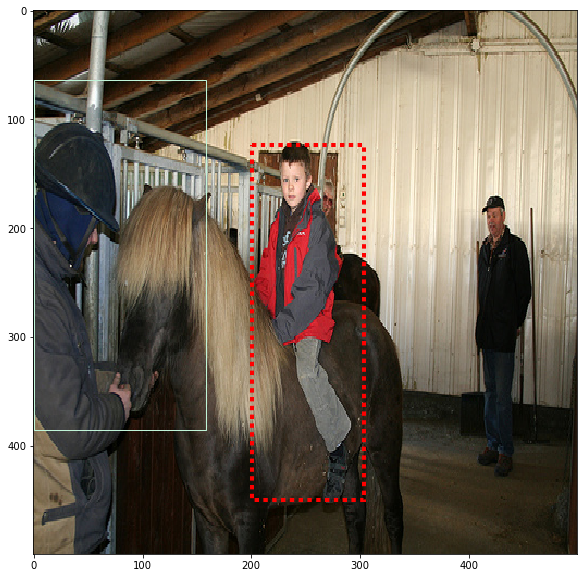

In [179]:
display_image_regions(
    np.array(image), regions[:1], train_gt_boxes[image_index])

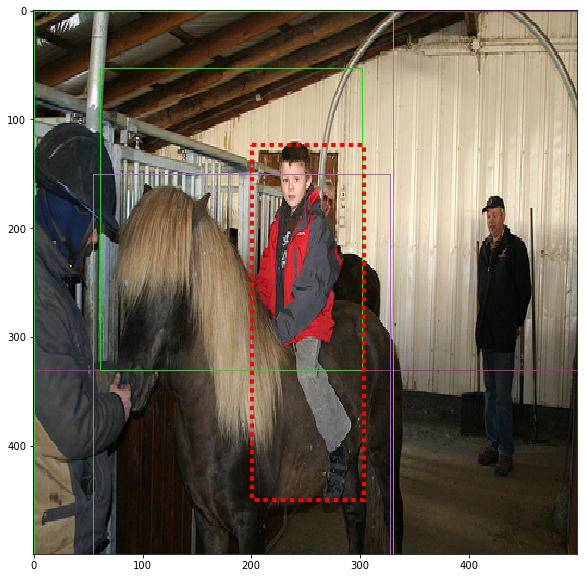

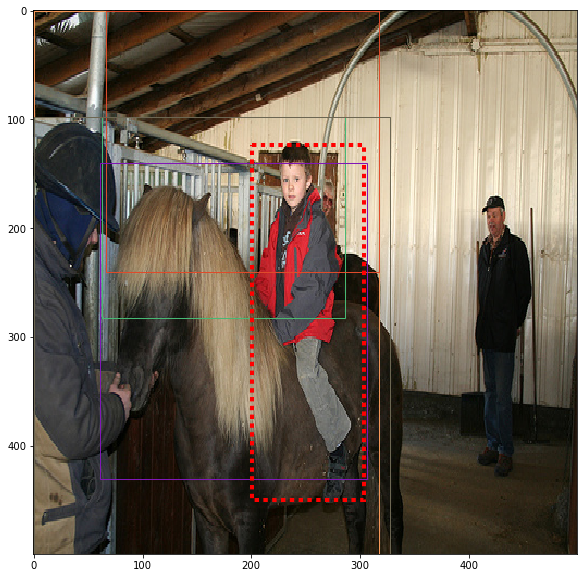

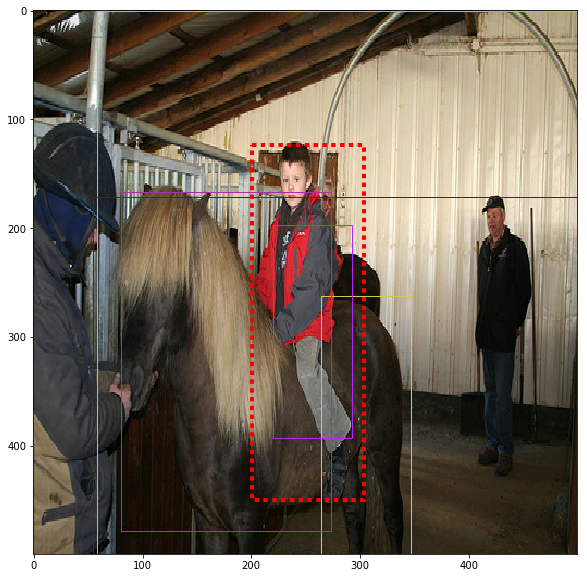

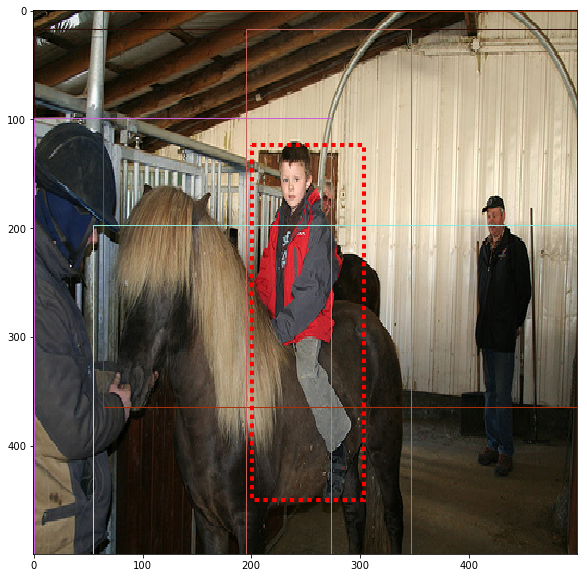

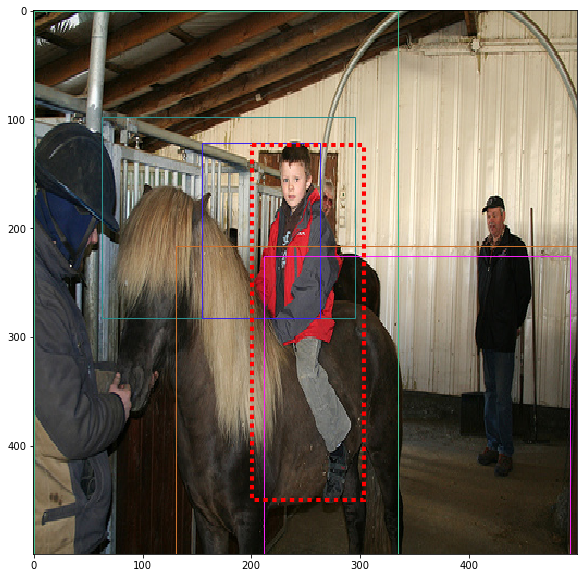

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


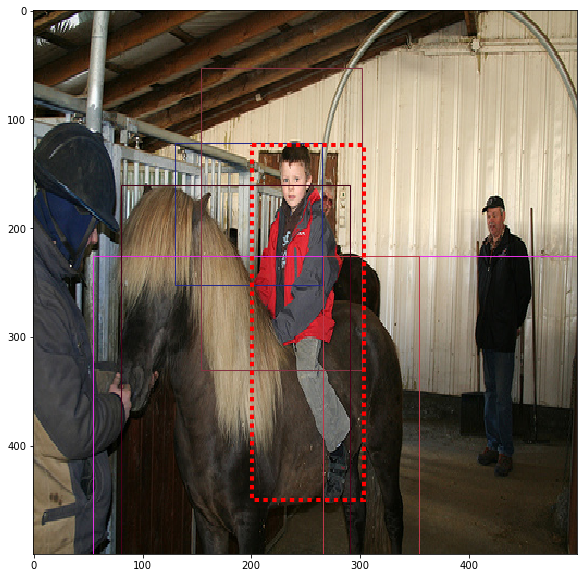

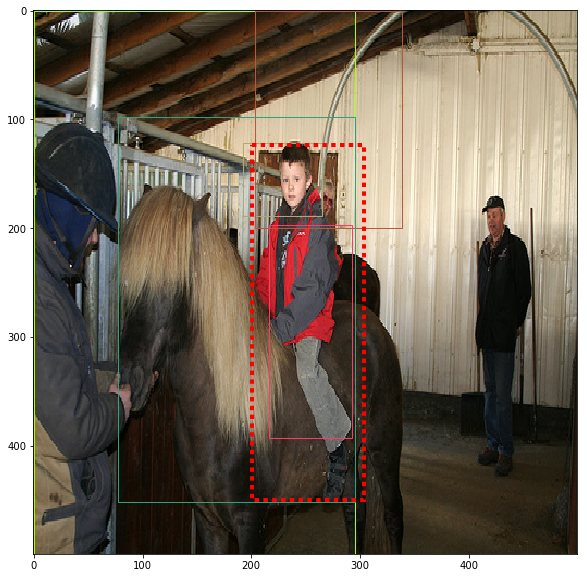

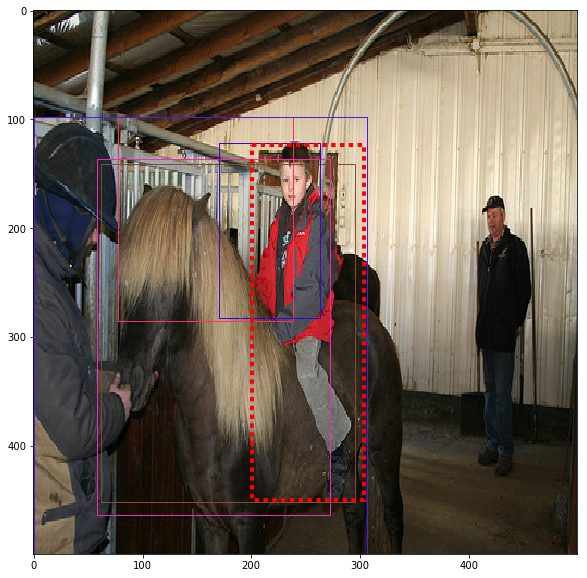

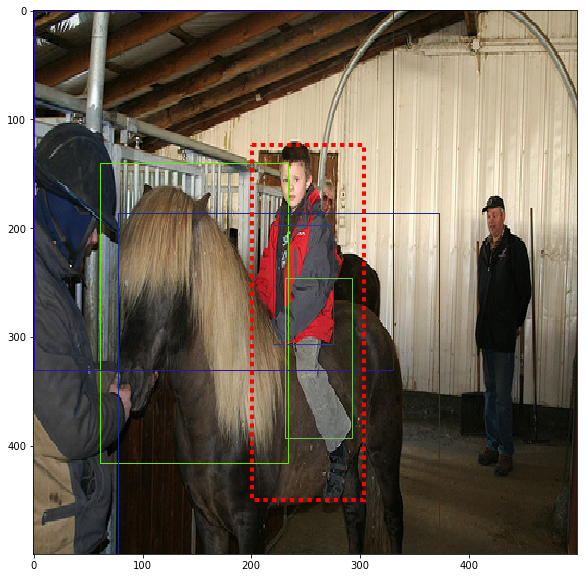

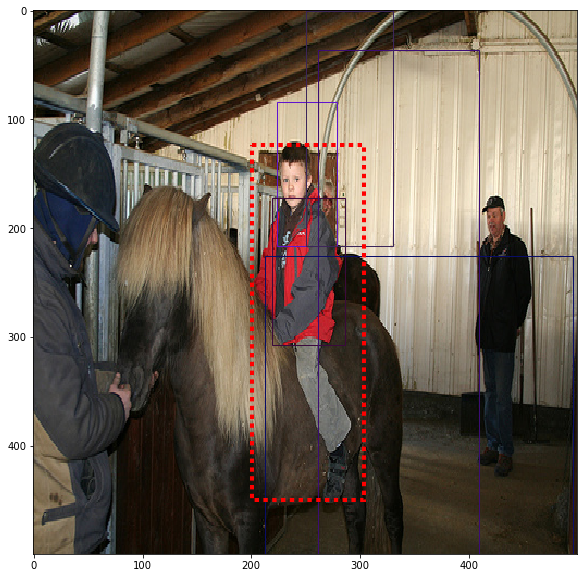

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


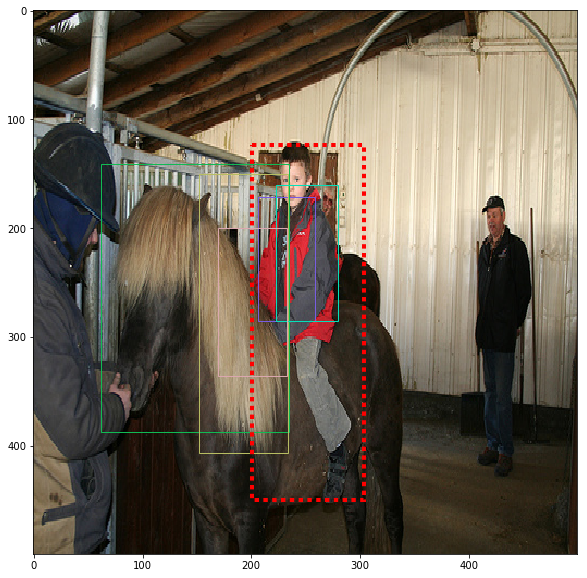

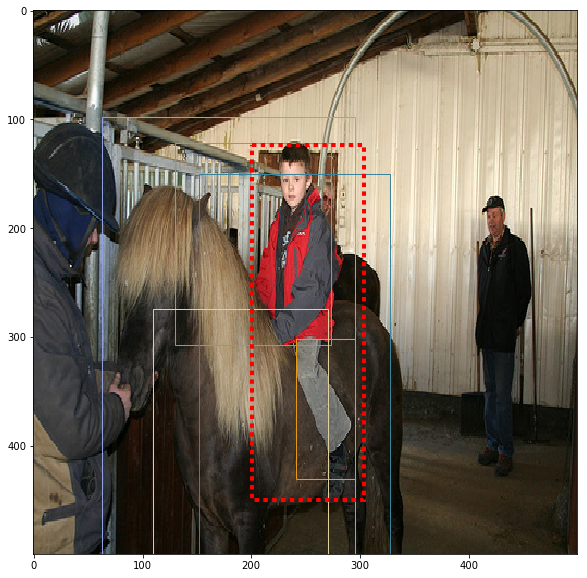

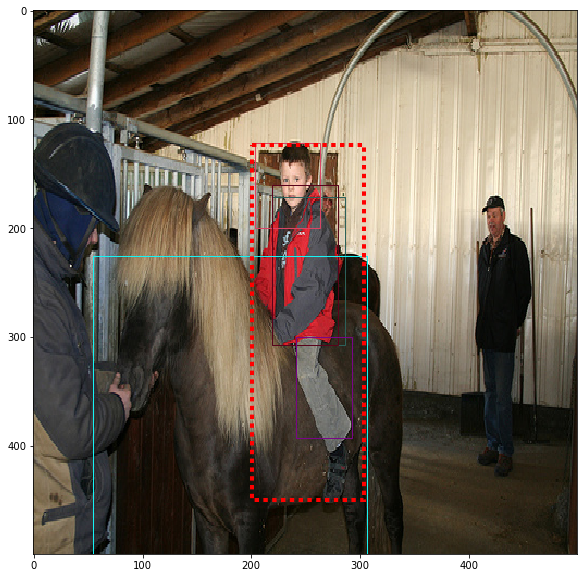

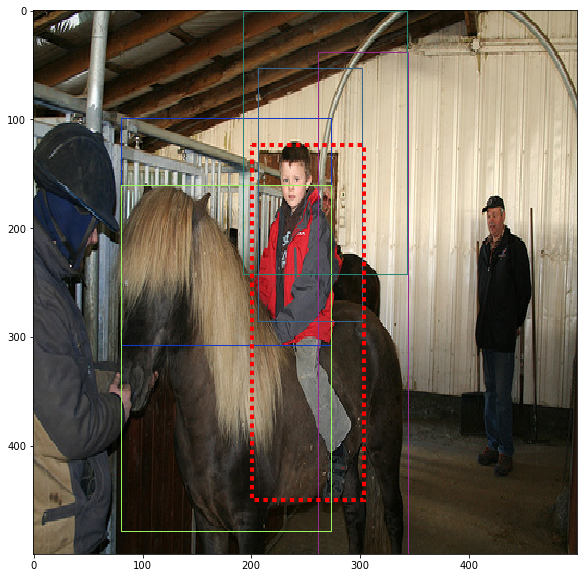

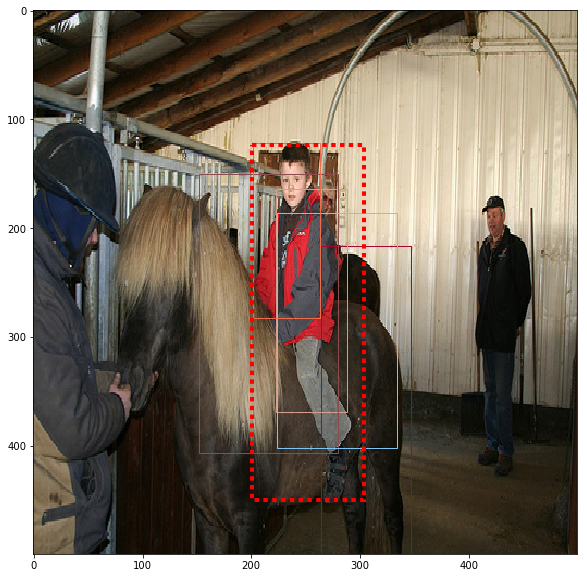

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


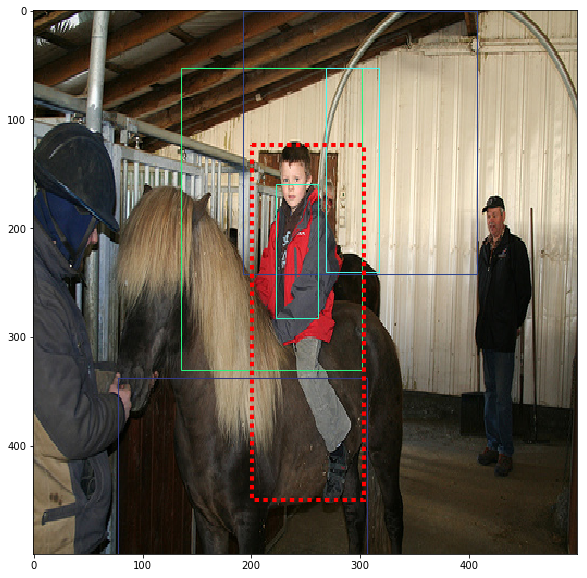

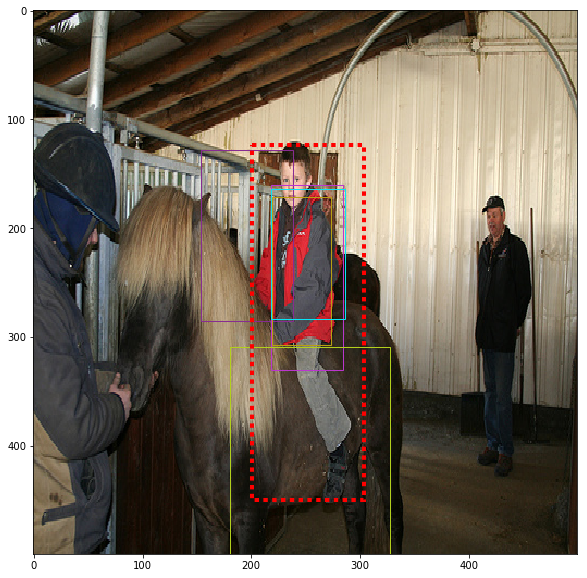

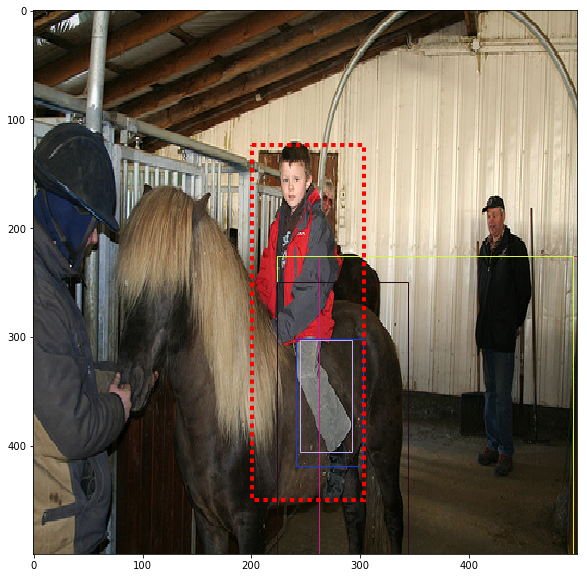

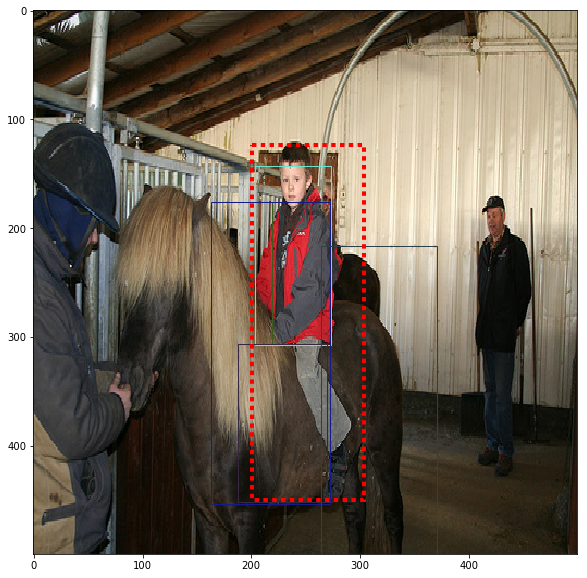

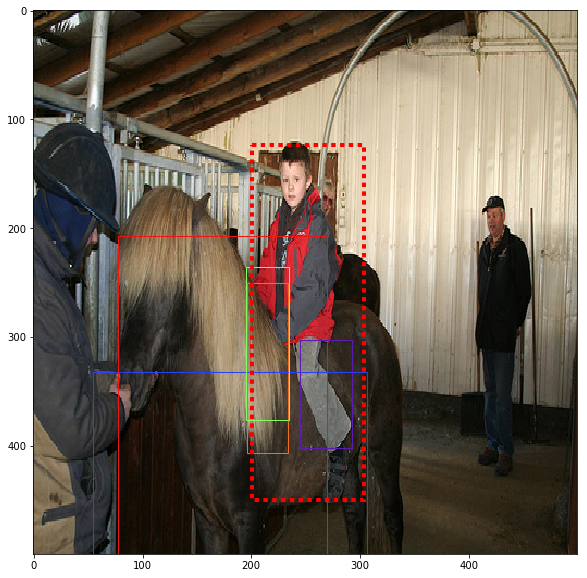

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


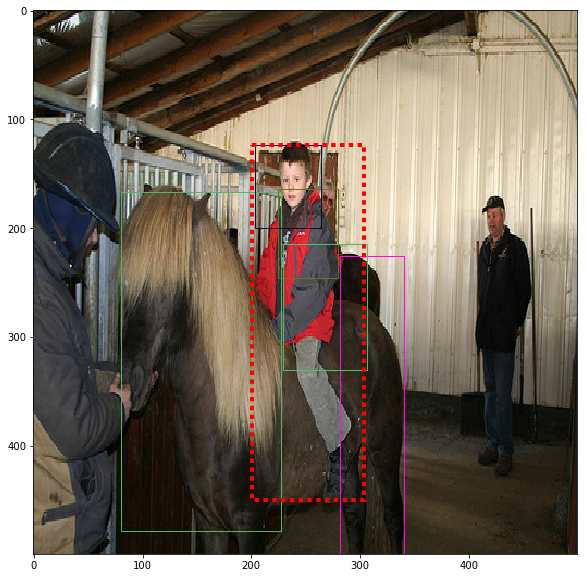

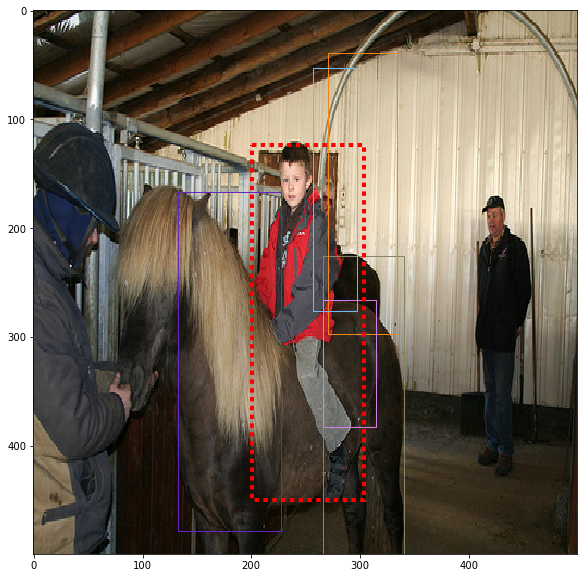

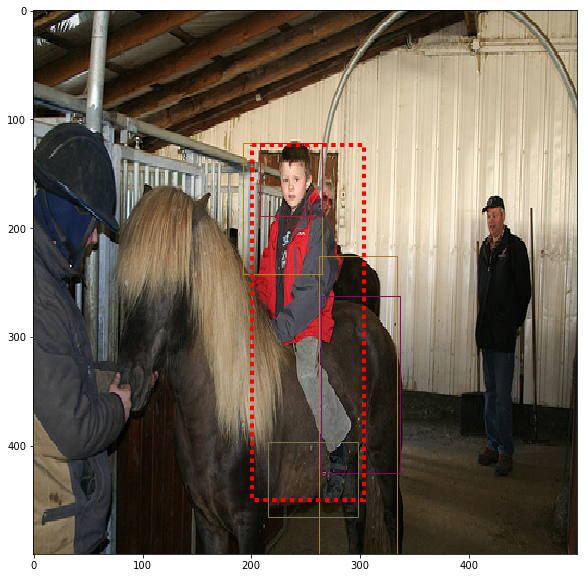

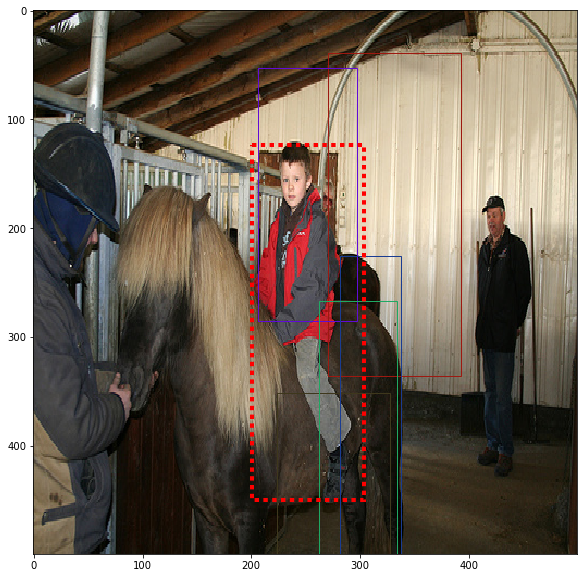

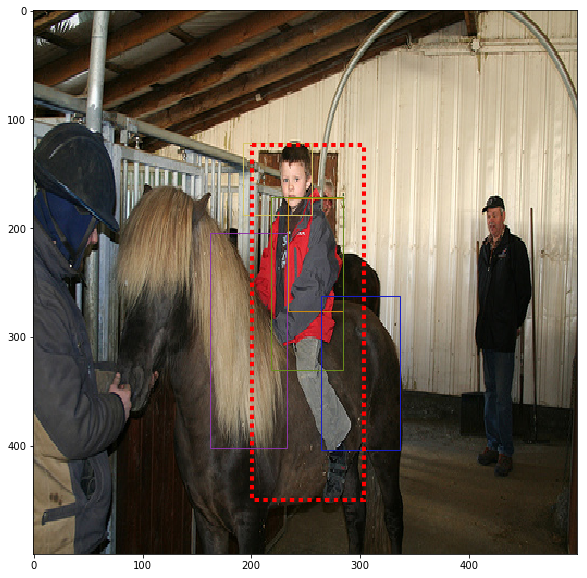

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


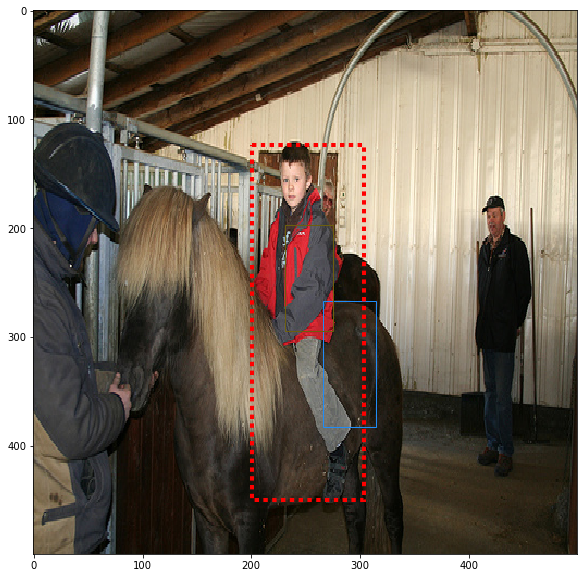

In [61]:
rois_batch_size = 5
for start in range(0, len(train_negative_rois[img_index]), rois_batch_size):
    end = start + rois_batch_size
    display_image_regions(train_samples[img_index],
                          train_negative_rois[img_index][start:end],
                          train_gt_boxes[img_index])

In [404]:
targets

array([[  0.    ,   0.    ,   0.    ,   0.    ,   0.    ],
       [  1.1816,   0.1409,   0.9706,   0.7267,  20.    ],
       [  0.    ,   0.    ,   0.    ,   0.    ,   0.    ],
       [  0.    ,   0.    ,   0.    ,   0.    ,   0.    ],
       [  0.896 ,   1.0643,   0.7846,  -0.8902,  20.    ],
       [  0.    ,   0.    ,   0.    ,   0.    ,   0.    ],
       [  0.    ,   0.    ,   0.    ,   0.    ,   0.    ],
       [  0.    ,   0.    ,   0.    ,   0.    ,   0.    ],
       [  0.    ,   0.    ,   0.    ,   0.    ,   0.    ],
       [ -1.1265,  -0.9491,  -0.6684,   0.2478,  20.    ],
       [  1.1179,   0.1409,   1.6352,   0.7267,  20.    ],
       [  0.    ,   0.    ,   0.    ,   0.    ,   0.    ],
       [  0.    ,   0.    ,   0.    ,   0.    ,   0.    ],
       [  0.    ,   0.    ,   0.    ,   0.    ,   0.    ],
       [  0.    ,   0.    ,   0.    ,   0.    ,   0.    ],
       [  0.    ,   0.    ,   0.    ,   0.    ,   0.    ],
       [  0.    ,   0.    ,   0.    ,   0.    ,   0.    

## Test ROI Pooling 1

In [165]:
rois

array([[   0.    ,   64.    ,  158.    ,  321.3333],
       [   0.    ,   25.3333,  500.    ,  474.6667],
       [ 150.    ,   69.3333,   92.    ,  229.3333],
       [ 145.    ,   61.3333,  207.    ,  394.6667],
       [ 108.    ,    0.    ,  392.    ,  394.6667],
       [ 133.    ,   60.    ,  218.    ,  440.    ],
       [ 145.    ,   61.3333,  216.    ,  394.6667],
       [ 148.    ,   69.3333,  148.    ,  318.6667],
       [ 138.    ,  369.3333,  362.    ,  130.6667],
       [ 149.    ,   66.6667,   87.    ,  233.3333],
       [ 147.    ,   60.    ,  204.    ,  364.    ],
       [   0.    ,  236.    ,  144.    ,  153.3333],
       [ 145.    ,   69.3333,  197.    ,  346.6667],
       [   0.    ,  238.6667,  144.    ,  150.6667],
       [   0.    ,    0.    ,  500.    ,  393.3333],
       [   0.    ,  117.3333,  160.    ,  182.6667],
       [ 153.    ,  134.6667,  246.    ,  185.3333],
       [   0.    ,  246.6667,  124.    ,  138.6667],
       [ 150.    ,  322.6667,  157.    ,  173.

In [166]:
image_arr = np.transpose(image_arr, (2, 0, 1))

In [167]:
image_var = Variable(torch.FloatTensor(
    np.expand_dims(image_arr, 0).astype(np.float32)))
rois_var = Variable(torch.FloatTensor(rois))

In [168]:
roi_pooling = ROIPooling(spatial_scale=1)
rois_pooled = roi_pooling(image_var, rois_var)

In [169]:
roi1 = np.transpose(rois_pooled.data.cpu().numpy(), [1, 2, 0])

In [170]:
roi1

array([[[  23.,   16.,    8.],
        [  25.,   15.,    5.],
        [  31.,   18.,    9.],
        ..., 
        [  75.,   47.,   24.],
        [  63.,   35.,   12.],
        [  46.,   24.,    1.]],

       [[  84.,   66.,   45.],
        [  66.,   51.,   29.],
        [  42.,   30.,   18.],
        ..., 
        [  72.,   52.,   26.],
        [  50.,   33.,    8.],
        [  50.,   24.,    7.]],

       [[ 109.,  110.,  102.],
        [ 107.,  108.,   90.],
        [ 104.,  101.,   82.],
        ..., 
        [  79.,   44.,   13.],
        [  82.,   47.,   16.],
        [  85.,   46.,   16.]],

       ..., 
       [[ 133.,  113.,   88.],
        [ 142.,  123.,   93.],
        [ 136.,  117.,   85.],
        ..., 
        [  60.,   52.,   41.],
        [  63.,   54.,   44.],
        [  70.,   57.,   48.]],

       [[ 127.,  114.,   82.],
        [ 136.,  120.,   87.],
        [ 136.,  116.,   89.],
        ..., 
        [  62.,   54.,   42.],
        [  66.,   56.,   45.],
        [ 

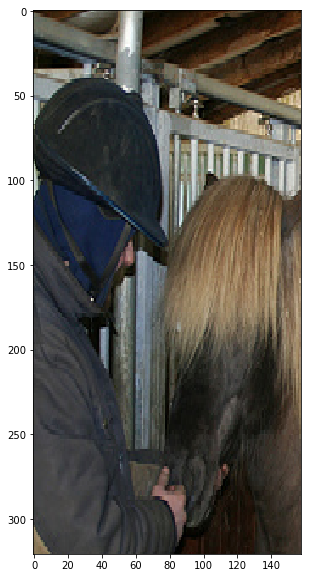

In [171]:
display_image_regions(roi1.astype('uint8'), [])

In [106]:
roi1 = np.transpose(rois_pooled[0].data.view(3, 7, 7).cpu().numpy(), [1, 2, 0])

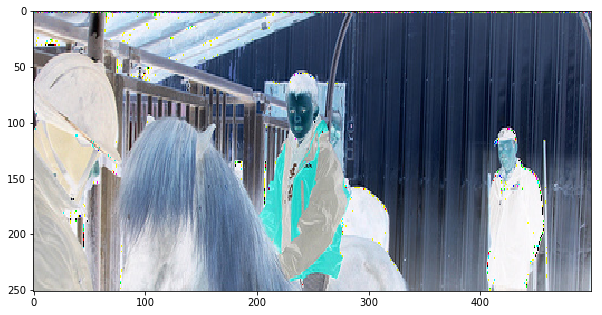

In [129]:
display_image_regions(roi1, [])

## Test VGG

In [136]:
vgg = get_vgg().cuda()

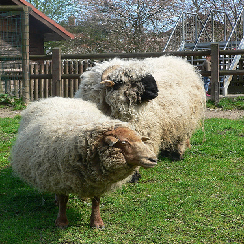

In [15]:
image = PIL.Image.open(filenames[3]).resize((244, 244))
image

In [16]:
normalize = torchvision.transforms.Normalize(mean=IMAGENET_MEAN,
                                             std=IMAGENET_STD)

preprocessed_image = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
    normalize])(image)

image_var = Variable(preprocessed_image.view(
    1, *preprocessed_image.size()).cuda())

In [243]:
out = vgg(image_var)
probas, indices = torch.max(out, 1)

In [244]:
indices

Variable containing:
 348
[torch.cuda.LongTensor of size 1x1 (GPU 0)]

In [137]:
del vgg

In [258]:
features = vgg.features(image_var)
features_flat = flatten(features)
softmax = vgg.classifier(features_flat)

In [259]:
probas, indices = torch.max(softmax, 1)

In [260]:
indices

Variable containing:
 348
[torch.cuda.LongTensor of size 1x1 (GPU 0)]

In [269]:
conv_feats = get_vgg_conv(skip_last_layers=0).cuda()(image_var)

In [273]:
np.sum(features.data.cpu().numpy() != conv_feats.data.cpu().numpy())

0

In [15]:
vgg_conv = get_vgg_conv(skip_last_layers=1).cuda()

In [16]:
reset_index('train')
images, rois, targets = get_batch()

In [17]:
feats = vgg_conv(Variable(images[0:1].cuda(), volatile=True))

In [18]:
reset_index()
precomputed_feats, _, _ = get_batch(use_features=True)

In [22]:
np.sum(feats.data.cpu().numpy()[0].astype(np.float16) != precomputed_feats[0])

0

In [140]:
vgg_conv = get_vgg_conv(skip_last_layers=1).cuda()

In [141]:
images, rois, targets = get_batch()

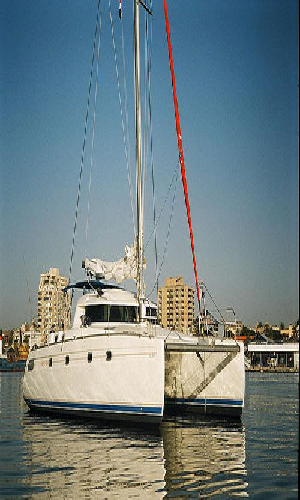

In [105]:
resized_image = to_image(denormalize(images[0])).resize((300, 500))
resized_image

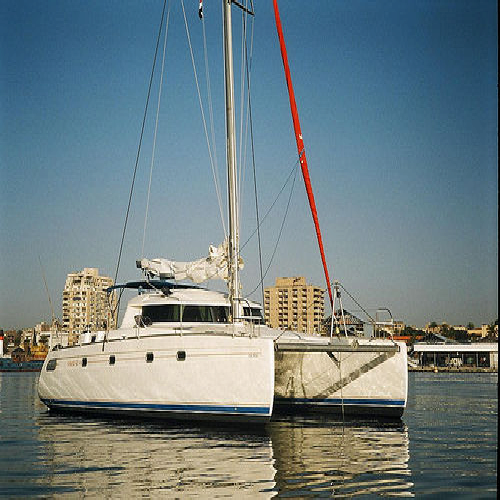

In [107]:
original_image = to_image(denormalize(images[0]))
original_image

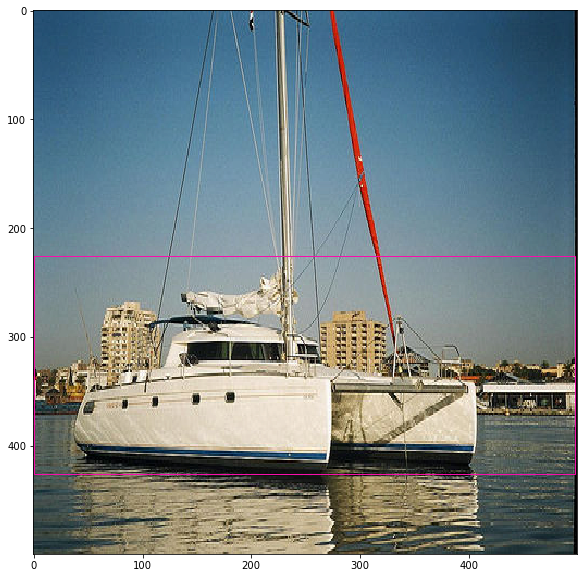

In [108]:
display_image_regions(original_image, rois[:64][:1])

In [110]:
resized_rois = []
for roi in rois[:64]:
    resized_rois.append(resize_bbox(roi, (500, 500), (300, 500)))

In [109]:
rois[:64]

array([[   0.    ,  225.9036,  498.    ,  200.3012],
       [   0.    ,  203.3133,  228.    ,  131.0241],
       [ 231.    ,    0.    ,   98.    ,  290.6627],
       [   0.    ,  328.3133,  411.    ,  171.6867],
       [   0.    ,  328.3133,  273.    ,  171.6867],
       [   0.    ,    0.    ,  412.    ,  500.    ],
       [  35.    ,  274.0964,  238.    ,  126.506 ],
       [   0.    ,  334.3373,  498.    ,  165.6627],
       [ 147.    ,    0.    ,   76.    ,  250.    ],
       [ 116.    ,    0.    ,  111.    ,  289.1566],
       [   0.    ,  165.6627,  330.    ,  246.988 ],
       [ 239.    ,   12.0482,   62.    ,  266.5663],
       [   0.    ,    0.    ,  498.    ,  500.    ],
       [   0.    ,    0.    ,  329.    ,  313.253 ],
       [ 238.    ,    0.    ,   83.    ,  290.6627],
       [  41.    ,  165.6627,  157.    ,  185.241 ],
       [   0.    ,    0.    ,  224.    ,  313.253 ],
       [ 218.    ,    0.    ,  134.    ,  287.6506],
       [ 239.    ,   12.0482,   84.    ,  283.

In [112]:
resized_rois

[array([   0.    ,  225.9036,  298.8   ,  200.3012]),
 array([   0.    ,  203.3133,  136.8   ,  131.0241]),
 array([ 138.6   ,    0.    ,   58.8   ,  290.6627]),
 array([   0.    ,  328.3133,  246.6   ,  171.6867]),
 array([   0.    ,  328.3133,  163.8   ,  171.6867]),
 array([   0. ,    0. ,  247.2,  500. ]),
 array([  21.    ,  274.0964,  142.8   ,  126.506 ]),
 array([   0.    ,  334.3373,  298.8   ,  165.6627]),
 array([  88.2,    0. ,   45.6,  250. ]),
 array([  69.6   ,    0.    ,   66.6   ,  289.1566]),
 array([   0.    ,  165.6627,  198.    ,  246.988 ]),
 array([ 143.4   ,   12.0482,   37.2   ,  266.5663]),
 array([   0. ,    0. ,  298.8,  500. ]),
 array([   0.   ,    0.   ,  197.4  ,  313.253]),
 array([ 142.8   ,    0.    ,   49.8   ,  290.6627]),
 array([  24.6   ,  165.6627,   94.2   ,  185.241 ]),
 array([   0.   ,    0.   ,  134.4  ,  313.253]),
 array([ 130.8   ,    0.    ,   80.4   ,  287.6506]),
 array([ 143.4   ,   12.0482,   50.4   ,  283.1325]),
 array([  64.8   ,

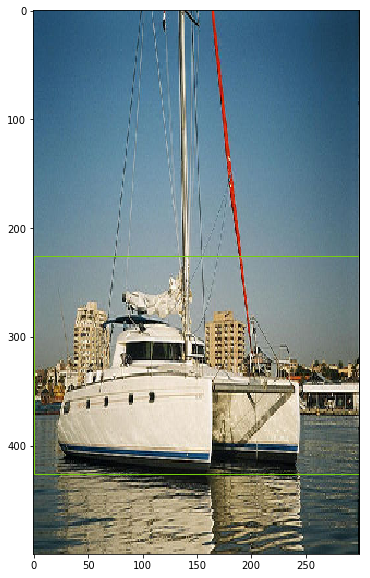

In [113]:
display_image_regions(resized_image, resized_rois[:1])

In [114]:
resized_tensor = normalize(torchvision.transforms.ToTensor()(resized_image))

In [115]:
resized_batch = resized_tensor.view(1, *resized_tensor.size())

In [116]:
image_var = Variable(resized_batch.cuda())

In [117]:
conv_feats = vgg_conv(image_var)

In [ ]:
out = nn.MaxPool2d(kernel_size=2, stride=2)(conv_feats)

In [276]:
np.sum(features.data.cpu().numpy() != out.data.cpu().numpy())

0

## Test ROI pooling 2

In [98]:
conv_feats, rois, targets = get_batch(use_features=True, )

In [99]:
roi_pooling = ROIPooling()

In [100]:
conv_feats

array([[[[ 0.7339,  0.1274,  0.3118, ...,  0.0491,  0.1728,  0.2649],
         [-0.339 ,  0.2551,  0.6777, ..., -0.195 , -0.1405,  0.8328],
         [ 0.4584,  0.4596, -0.1723, ..., -0.219 , -0.0067, -0.2755],
         ..., 
         [-0.5822,  0.6144, -0.1988, ...,  0.8153,  0.9682, -0.346 ],
         [ 0.7472,  0.5965,  0.0888, ...,  0.3405,  0.5492, -0.7018],
         [ 0.2248,  1.401 , -0.5235, ...,  0.0196,  0.4354,  1.1489]],

        [[-0.3083, -0.2278,  0.3293, ...,  0.284 ,  0.7423,  0.0141],
         [ 0.2465,  0.0153,  0.5369, ...,  0.8715, -0.457 , -0.2749],
         [-0.0155, -1.3162,  0.4522, ..., -0.7422, -0.2852,  0.99  ],
         ..., 
         [ 0.6899,  0.3788, -0.7178, ...,  0.8494,  0.6326,  0.3548],
         [-0.5563, -0.5929,  1.2326, ...,  0.1718, -0.742 , -0.7184],
         [ 0.1555,  0.5331,  0.3571, ...,  0.1638, -0.2535,  0.5524]],

        [[-0.3238, -0.6035,  0.0982, ..., -0.5934,  0.2205,  0.6986],
         [ 1.0368, -0.3107, -1.4975, ...,  1.0483,  0.77

In [101]:
rois

array([[ 202.    ,  160.6607,  104.    ,  270.2703],
       [  54.    ,  225.2252,  446.    ,  274.7748],
       [ 272.    ,   37.5375,   63.    ,  258.2583],
       [ 219.    ,  160.6607,   87.    ,  270.2703],
       [ 219.    ,  163.6637,   74.    ,  289.7898],
       [ 271.    ,   39.039 ,  122.    ,  297.2973],
       [ 223.    ,  159.1592,   57.    ,  123.1231],
       [ 216.    ,  163.6637,   79.    ,  229.7297],
       [ 245.    ,  303.3033,   48.    ,   99.0991],
       [ 188.    ,  160.6607,  105.    ,  291.2913],
       [  66.    ,    0.    ,  251.    ,  240.2402],
       [ 223.    ,  163.6637,   65.    ,  205.7057],
       [ 202.    ,  121.6216,   61.    ,  160.6607],
       [ 154.    ,  207.2072,  116.    ,  292.7928],
       [ 229.    ,  214.7147,   77.    ,  115.6156],
       [ 220.    ,  196.6967,   73.    ,  255.2553],
       [   0.    ,   99.0991,  273.    ,  268.7688],
       [ 188.    ,  160.6607,  107.    ,  291.2913],
       [ 203.    ,  139.6396,   90.    ,  313.

In [102]:
rois_var = Variable(torch.FloatTensor(rois).cuda())

In [47]:
np.asarray([148.,   69.3333,   92.,  318.6667]) * (1 / 16)

array([  9.25  ,   4.3333,   5.75  ,  19.9167])

In [44]:
x1, y1, x2, y2 = (9.25, 4.333333492279053, 15.0, 24.249999523162842)
rois

array([[ 148.    ,   69.3333,   92.    ,  318.6667],
       [  71.    ,  314.6667,  257.    ,  185.3333],
       [   0.    ,  121.3333,  159.    ,  173.3333],
       [ 177.    ,  285.3333,  147.    ,  138.6667],
       [ 207.    ,  230.6667,  124.    ,  165.3333],
       [ 108.    ,    0.    ,  392.    ,  394.6667],
       [  75.    ,  241.3333,  152.    ,  185.3333],
       [  71.    ,  285.3333,  260.    ,  214.6667],
       [   0.    ,  236.    ,  144.    ,  264.    ],
       [   0.    ,  236.    ,  144.    ,  153.3333],
       [   0.    ,   21.3333,  500.    ,  478.6667],
       [   0.    ,   64.    ,  157.    ,  321.3333],
       [   0.    ,    0.    ,  500.    ,  500.    ],
       [ 133.    ,   69.3333,  204.    ,  430.6667],
       [  67.    ,  306.6667,  109.    ,  193.3333],
       [   0.    ,   93.3333,  159.    ,  293.3333],
       [ 150.    ,   60.    ,  201.    ,  357.3333],
       [ 153.    ,  134.6667,  246.    ,  185.3333],
       [ 148.    ,   46.6667,  204.    ,  369.

In [105]:
conv_feats_var = Variable(torch.FloatTensor(conv_feats).cuda())

In [106]:
pooled = roi_pooling(conv_feats_var, rois_var)

In [139]:
nn.AdaptiveMaxPool2d((7, 7))(conv_feats[0, 0:1, 14:27, 0:19])

Variable containing:
(0 ,.,.) = 
  0.0000  0.0000  0.0000  0.0000  0.0000  0.3712  0.0000
  0.0000  0.0000  0.0000  0.3760  0.1835  0.0000  0.0000
  1.4739  0.5643  0.0000  0.7504  0.1835  0.0000  0.0000
  1.5155  1.5155  1.6866  1.6866  0.0000  0.0000  0.0000
  0.0000  0.5316  1.6596  1.6261  0.0000  0.0000  0.0000
  0.0000  0.5316  0.0000  0.0000  0.0000  0.0000  0.0000
  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000
[torch.cuda.FloatTensor of size 1x7x7 (GPU 0)]

In [ ]:
x1, y1, x2, y2 = (0, 14, 19, 27)

In [107]:
pooled[0][0].view((7, 7))

Variable containing:
 0.0224  0.0224  0.9171  0.9171  1.1871  1.1871  1.1871
 0.0224  0.0224  0.9171  0.9171  1.1871  1.1871  1.1871
 0.0224  0.0224  0.9171  0.9171  1.1871  1.1871  1.1871
 1.0495  1.0495  1.4845  1.4845  1.4845  1.1871  1.1871
 1.0495  1.0495  1.4845  1.4845  1.4845  0.3408  0.3408
 1.0495  1.0495  1.4845  1.4845  1.4845  0.3408  0.3408
 1.0495  1.0495  1.4845  1.4845  1.4845  0.3408  0.3408
[torch.cuda.FloatTensor of size 7x7 (GPU 0)]

## Test ROI Pooling 3

In [ ]:
template <typename Dtype>
__global__ void ROIPoolForward(const int nthreads, const Dtype* bottom_data,
    const Dtype spatial_scale, const int channels, const int height,
    const int width, const int pooled_height, const int pooled_width,
    const Dtype* bottom_rois, Dtype* top_data, int* argmax_data) {
  CUDA_KERNEL_LOOP(index, nthreads) {
    // (n, c, ph, pw) is an element in the pooled output
    int pw = index % pooled_width;
    int ph = (index / pooled_width) % pooled_height;
    int c = (index / pooled_width / pooled_height) % channels;
    int n = index / pooled_width / pooled_height / channels;

    bottom_rois += n * 5;
    int roi_batch_ind = bottom_rois[0];
    int roi_start_w = round(bottom_rois[1] * spatial_scale);
    int roi_start_h = round(bottom_rois[2] * spatial_scale);
    int roi_end_w = round(bottom_rois[3] * spatial_scale);
    int roi_end_h = round(bottom_rois[4] * spatial_scale);

    // Force malformed ROIs to be 1x1
    int roi_width = max(roi_end_w - roi_start_w + 1, 1);
    int roi_height = max(roi_end_h - roi_start_h + 1, 1);
    Dtype bin_size_h = static_cast<Dtype>(roi_height)
                       / static_cast<Dtype>(pooled_height);
    Dtype bin_size_w = static_cast<Dtype>(roi_width)
                       / static_cast<Dtype>(pooled_width);

    int hstart = static_cast<int>(floor(static_cast<Dtype>(ph)
                                        * bin_size_h));
    int wstart = static_cast<int>(floor(static_cast<Dtype>(pw)
                                        * bin_size_w));
    int hend = static_cast<int>(ceil(static_cast<Dtype>(ph + 1)
                                     * bin_size_h));
    int wend = static_cast<int>(ceil(static_cast<Dtype>(pw + 1)
                                     * bin_size_w));

    // Add roi offsets and clip to input boundaries
    hstart = min(max(hstart + roi_start_h, 0), height);
    hend = min(max(hend + roi_start_h, 0), height);
    wstart = min(max(wstart + roi_start_w, 0), width);
    wend = min(max(wend + roi_start_w, 0), width);
    bool is_empty = (hend <= hstart) || (wend <= wstart);

    // Define an empty pooling region to be zero
    Dtype maxval = is_empty ? 0 : -FLT_MAX;
    // If nothing is pooled, argmax = -1 causes nothing to be backprop'd
    int maxidx = -1;
    bottom_data += (roi_batch_ind * channels + c) * height * width;
    for (int h = hstart; h < hend; ++h) {
      for (int w = wstart; w < wend; ++w) {
        int bottom_index = h * width + w;
        if (bottom_data[bottom_index] > maxval) {
          maxval = bottom_data[bottom_index];
          maxidx = bottom_index;
        }
      }
    }
    top_data[index] = maxval;
    argmax_data[index] = maxidx;
  }
}

In [210]:
class RoIPool(nn.Module):
    def __init__(self, size=(7, 7), spatial_scale=1. / 16):
        super(RoIPool, self).__init__()
        self.pooled_width = int(size[0])
        self.pooled_height = int(size[1])
        self.spatial_scale = float(spatial_scale)

    def forward(self, features, rois):
        batch_size, num_channels, data_height, data_width = features.size()
        num_rois = rois.size()[0]
        outputs = Variable(torch.zeros(num_rois, num_channels,
                                       self.pooled_height, self.pooled_width)).cuda()

        for roi_ind, roi in enumerate(rois):
            # batch_ind = int(roi[0].data[0])
            batch_ind = roi_ind // 64
            roi_start_w, roi_start_h, roi_width, roi_height = np.round(
                roi[:4].data.cpu().numpy() * self.spatial_scale).astype(int)
            roi_width = max(roi_width, 1)
            roi_height = max(roi_height, 1)
            roi_end_w = roi_start_w + roi_width - 1
            roi_end_h = roi_start_h + roi_height - 1

#             print('Global', roi_start_w, roi_end_w, roi_start_h, roi_end_h)

#             roi_width = max(roi_end_w - roi_start_w + 1, 1)
#             roi_height = max(roi_end_h - roi_start_h + 1, 1)
            bin_size_w = float(roi_width) / float(self.pooled_width)
            bin_size_h = float(roi_height) / float(self.pooled_height)

            for ph in range(self.pooled_height):
                hstart = int(np.floor(ph * bin_size_h))
                hend = int(np.ceil((ph + 1) * bin_size_h))
                hstart = min(data_height, max(0, hstart + roi_start_h))
                hend = min(data_height, max(0, hend + roi_start_h))
                for pw in range(self.pooled_width):
                    wstart = int(np.floor(pw * bin_size_w))
                    wend = int(np.ceil((pw + 1) * bin_size_w))
                    wstart = min(data_width, max(0, wstart + roi_start_w))
                    wend = min(data_width, max(0, wend + roi_start_w))
#                     print(wstart, wend, hstart, hend)
                    is_empty = (hend <= hstart) or(wend <= wstart)
                    if is_empty:
                        outputs[roi_ind, :, ph, pw] = 0
                    else:
                        data = features[batch_ind]
                        outputs[roi_ind, :, ph, pw] = torch.max(
                            torch.max(data[:, hstart:hend, wstart:wend], 1)[0], 2)[0].view(-1)
        return outputs

In [22]:
class ROIPooling(torch.nn.Module):
    def __init__(self, size=(7, 7), spatial_scale=(1. / 16.),
                 rois_per_map=64):
        ''' 
        size: The output size for each region of interest.
        spatial_scale: How much to scale ROI dimensions before slicing
            activations map.
        '''
        super(ROIPooling, self).__init__()
        assert (len(size) == 2), 'ROI Pooling expects a 2d output size.'
        self.size = size
        self.spatial_scale = spatial_scale
        self.rois_per_map = rois_per_map

    def forward(self, x, all_rois):
        ''' Do ROI pooling over the convolutional activations maps. 
        Each ROI specifies a region of convolutional features to resize to a 
        predefined size (usually 7x7) using Max Pool.

        Args:
            x: feature activations map: sample_index x channels x width x height
            all_rois: 2d Region tensor (num rois x 4). 
                Each region has (x, y, w, h)
        '''
        assert (len(x.size()) == 4), ('ROI Pooling expects feature maps as '
                                      + '4d Tensor.')
        assert (all_rois.size(1) == 4), (
            'ROI Pooling expects each ROIs to be like: (x, y, w, h).')

        # The output will be sized:
        # (number of rois, conv channels, roi output as a vector)
        output_size = (all_rois.size(0), x.size(1),
                       self.size[0] * self.size[1])
        outputs = Variable(torch.zeros(output_size).cuda())

        for img_index, features in enumerate(x):
            start_roi_index = img_index * self.rois_per_map
            end_roi_index = (img_index + 1) * self.rois_per_map
            rois = all_rois[start_roi_index:end_roi_index]
            for roi_index, roi in enumerate(rois):
                roi_activations = self._get_roi_activations(roi, features)
#                 print(roi_activations[0])
                output = torch.nn.modules.pooling.AdaptiveMaxPool2d(self.size)(
                    roi_activations)
                output_index = (img_index + 1) * roi_index

                outputs[output_index] = output.view(-1,
                                                    self.size[0] * self.size[1])
                return outputs
        return outputs

    def _get_roi_activations(self, roi, features):
        ''' Returns the feature activations in a RoI area.
        Args:
            roi: a RoI tensor: (x, y, w, h)
            features: CNN features tensor: channels x width x height
        '''
        roi_scaled = roi.data.float() * self.spatial_scale
        x1, y1, w, h = roi_scaled
        x1 = max(x1, 0)
        y1 = max(y1, 0)
        w = max(w, 1)
        h = max(h, 1)

        # TODO INVESTIGATE WHY THIS IS NEEDED
        x1 = min(x1, features.size(1) - 1)
        y1 = min(y1, features.size(2) - 1)

        x2, y2 = x1 + w - 1, y1 + h - 1
        x1, y1, x2, y2 = np.floor(x1), np.floor(y1), np.ceil(x2), np.ceil(y2)
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        # Make sure minimal slice size is 1 across x and y
        x2 = max(x2, x1 + 1)
        y2 = max(y2, y1 + 1)

        print(x1, y1, x2, y2)

        roi_activations = features[:, y1:y2, x1:x2]
        return roi_activations

In [209]:
reset_index('train')
conv_feats, rois, targets = get_batch(use_features=True, 
                                      roi_batch_size=64,
                                      images_per_batch=1)
conv_feats_var = Variable(
    torch.FloatTensor(conv_feats.astype(np.float32)).cuda(),
    volatile=True)

In [210]:
rois_var = np_to_var(rois)

In [211]:
roi_pooling_mine = ROIPooling()
roi_pooling_new = RoIPool_GPU(7, 7, 1./16).cuda()

In [213]:
rois_pooled_new = roi_pooling_new(conv_feats_var[:1], rois_var[:64])
# rois_pooled_mine = roi_pooling_mine(conv_feats_var, rois_var)

In [214]:
np.sum(rois_pooled_new.data.cpu().numpy() != 0)

290938

In [215]:
rois_pooled_new[0][30]

Variable containing:
 0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000
 0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000
 0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000
 0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000
 0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000
 0.0000  0.0000  0.7373  0.7373  0.7373  0.0000  0.0000
 0.0000  0.0000  0.7373  0.7373  0.7373  0.0000  0.0000
[torch.cuda.FloatTensor of size 7x7 (GPU 0)]

In [151]:
np.sum(rois_pooled_mine.data.cpu().numpy()
       != rois_pooled_new.data.view(128, 512, 49).cpu().numpy())

260063

In [144]:
rois_pooled_mine[0][120].view((7, 7))

Variable containing:
    0     0     0     0     0     0     0
    0     0     0     0     0     0     0
    0     0     0     0     0     0     0
    0     0     0     0     0     0     0
    0     0     0     0     0     0     0
    0     0     0     0     0     0     0
    0     0     0     0     0     0     0
[torch.cuda.FloatTensor of size 7x7 (GPU 0)]

In [143]:
rois_pooled_new[0][120].view((7, 7))

Variable containing:
    0     0     0     0     0     0     0
    0     0     0     0     0     0     0
    0     0     0     0     0     0     0
    0     0     0     0     0     0     0
    0     0     0     0     0     0     0
    0     0     0     0     0     0     0
    0     0     0     0     0     0     0
[torch.cuda.FloatTensor of size 7x7 (GPU 0)]